<a href="https://colab.research.google.com/github/Aisyaululasmi/Assignment/blob/main/Hands_On_CVL_Aisya_Ulul_Asmi.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Gambar 1

Program 1

Tujuan : menggunakan thresholding utk menentukan baseline counting line

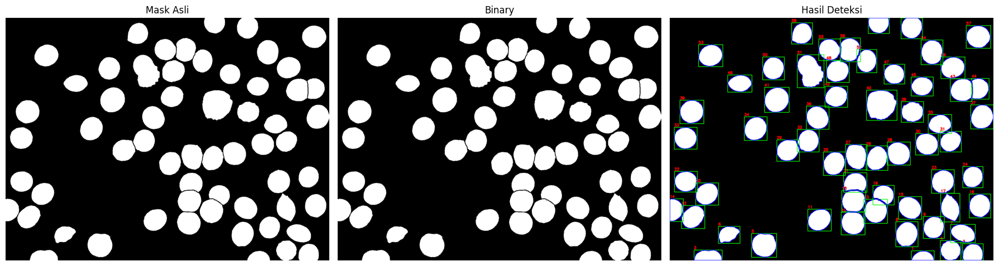

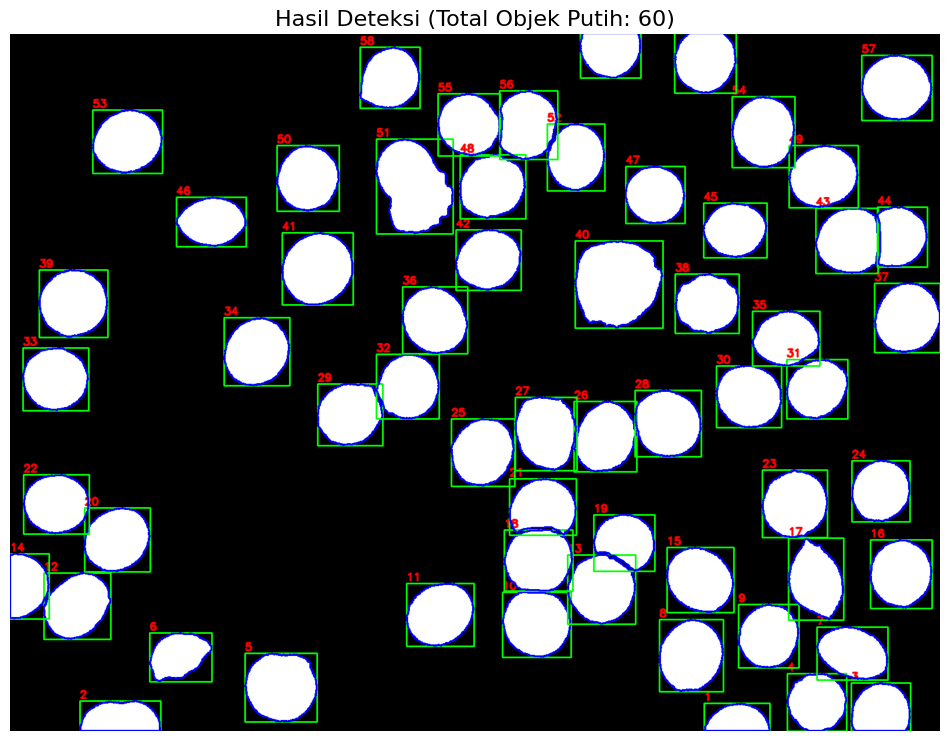

In [10]:
import cv2
import matplotlib.pyplot as plt

mask_path = "002f20ad-2ace-499c-9335-c9080bc3e6b5-mask.png"
mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

_, binary = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)

contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

output = cv2.imread(mask_path)
font = cv2.FONT_HERSHEY_SIMPLEX

for i, cnt in enumerate(contours, 1):
    x, y, w, h = cv2.boundingRect(cnt)
    cv2.rectangle(output, (x, y), (x+w, y+h), (0, 255, 0), 2)     # kotak hijau
    cv2.drawContours(output, [cnt], -1, (255, 0, 0), 2)           # kontur biru
    cv2.putText(output, str(i), (x, y-5), font, 0.6, (0,0,255), 2, cv2.LINE_AA)

plt.figure(figsize=(18,6))

plt.subplot(1,3,1); plt.title("Mask Asli"); plt.imshow(mask, cmap="gray"); plt.axis("off")
plt.subplot(1,3,2); plt.title("Binary"); plt.imshow(binary, cmap="gray"); plt.axis("off")
plt.subplot(1,3,3); plt.title("Hasil Deteksi"); plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB)); plt.axis("off")

plt.tight_layout()
plt.show()

plt.figure(figsize=(12,12))
plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
plt.title(f"Hasil Deteksi (Total Objek Putih: {len(contours)})", fontsize=16)
plt.axis("off")
plt.show()

Program 2


Solusi : segmentasi atau deteksi objek

Jumlah sel terdeteksi (valid): 54


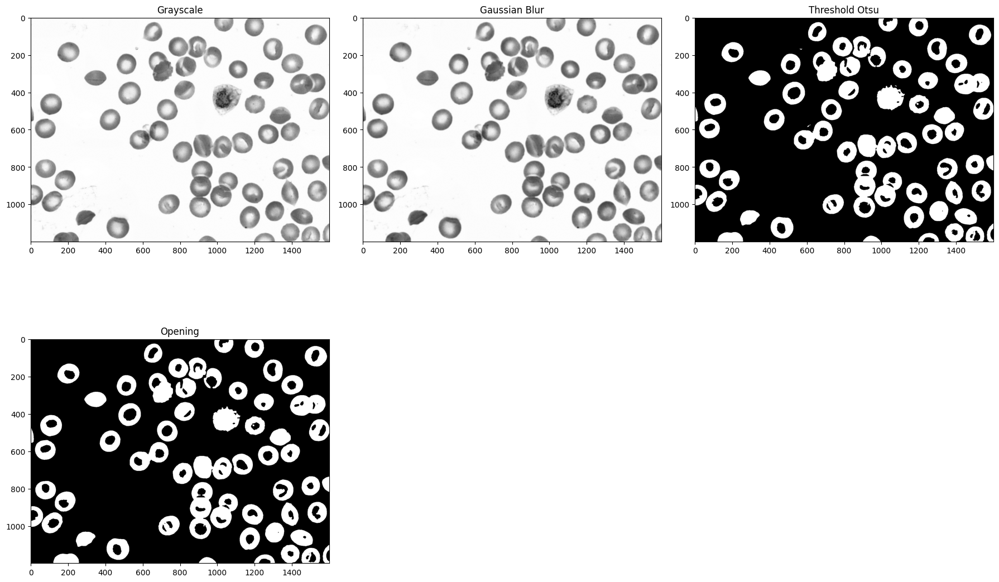

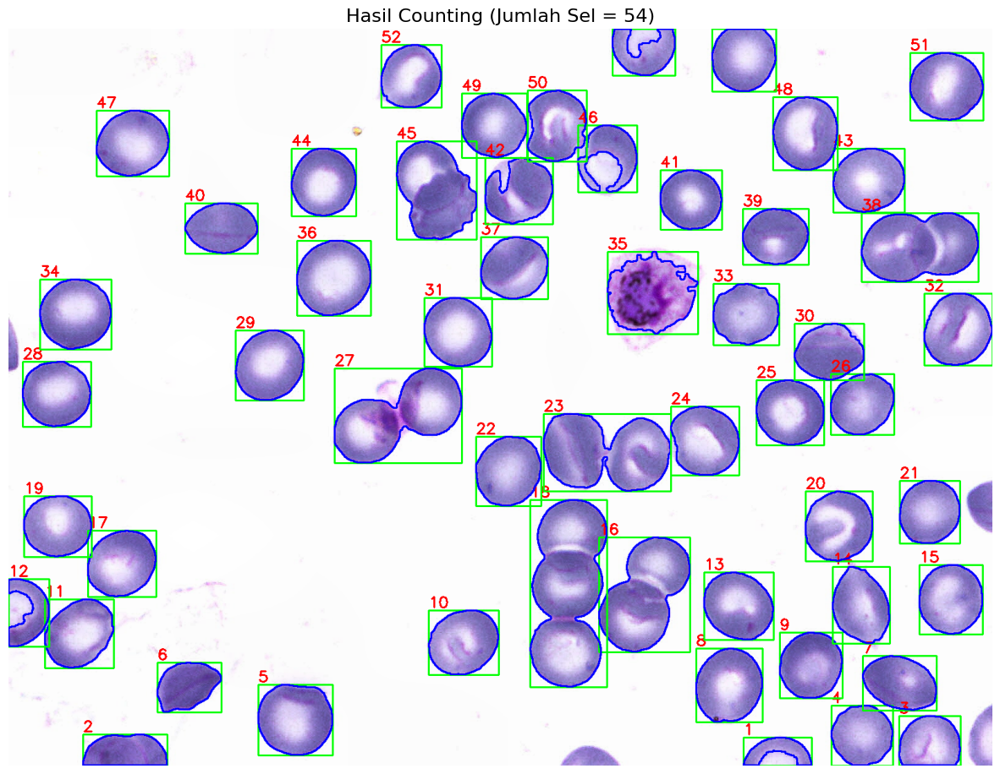

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img = cv2.imread("002f20ad-2ace-499c-9335-c9080bc3e6b5.png") #gambar original

#menghaluskan gambar sel dan menghilangkan noise
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) #convert ke gray
blur = cv2.GaussianBlur(gray, (5, 5), 0) #blurring gambar

#menggunakan thresholding otsu - mengubah ke black and whita supaya gambarnya menjadi 2 dimensi
_, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
kernel = np.ones((5, 5), np.uint8) #gambar yg overlapping
opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=1) #ukuran kernel kecil dan overlapping tipis (1/2 pixel) bisa digunakan morfologi

contours, _ = cv2.findContours(opening, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE) #mendapatkan kontur setelah terpisah utk dihitung selnya

output = img.copy()

min_area = 2500 #threshold static utk menghitung sel yg kecil dan terpotong di pinggir2
valid_count = 0
for i, cnt in enumerate(contours):
    area = cv2.contourArea(cnt)
    if area > min_area: #area : luas area dari sel yg akan dihitung #min area : menghitung data sel yg tidak perlu dihitung
        valid_count += 1
        (x, y, w, h) = cv2.boundingRect(cnt) #output xy (sumbu x dan y) wh (weight height)
        cv2.rectangle(output, (x, y), (x+w, y+h), (0, 255, 0), 2)
        cv2.drawContours(output, [cnt], -1, (255,0,0), 2)
        cv2.putText(output, str(valid_count), (x, y-5), cv2.FONT_HERSHEY_SIMPLEX,
                    0.8, (0, 0, 255), 2)

print("Jumlah sel terdeteksi (valid):", valid_count)

plt.figure(figsize=(18,12))

plt.subplot(2,3,1); plt.title("Grayscale"); plt.imshow(gray, cmap="gray")
plt.subplot(2,3,2); plt.title("Gaussian Blur"); plt.imshow(blur, cmap="gray")
plt.subplot(2,3,3); plt.title("Threshold Otsu"); plt.imshow(thresh, cmap="gray")
plt.subplot(2,3,4); plt.title("Opening"); plt.imshow(opening, cmap="gray")

plt.tight_layout()
plt.show()

plt.figure(figsize=(15,15))
plt.title(f"Hasil Counting (Jumlah Sel = {valid_count})", fontsize=16)
plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()


Program 3

* utk yg overlap akan discan menggunakan template matching, dicounting yg
* asumsi : yg overlap areanya besar



Jumlah sel darah yang terdeteksi: 60


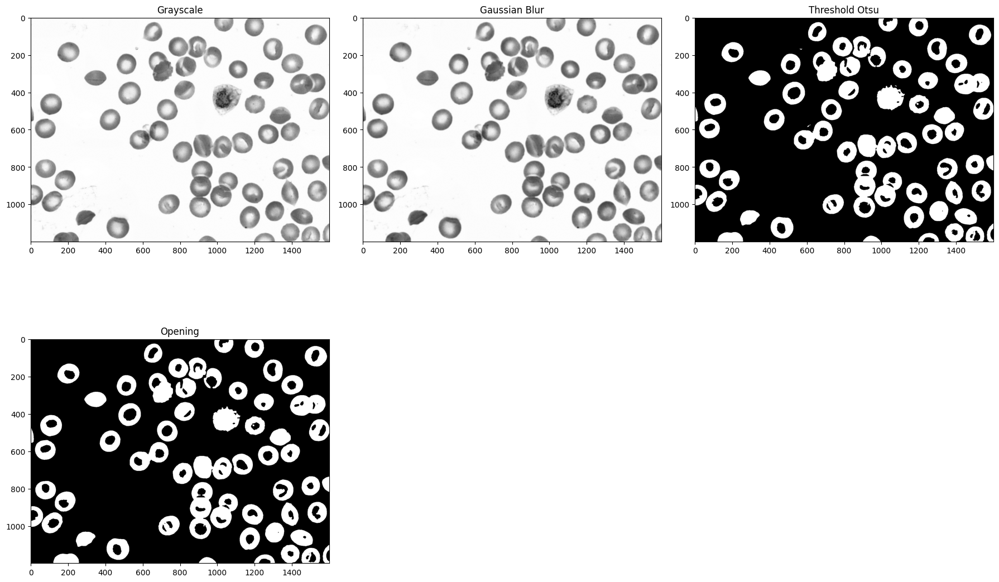

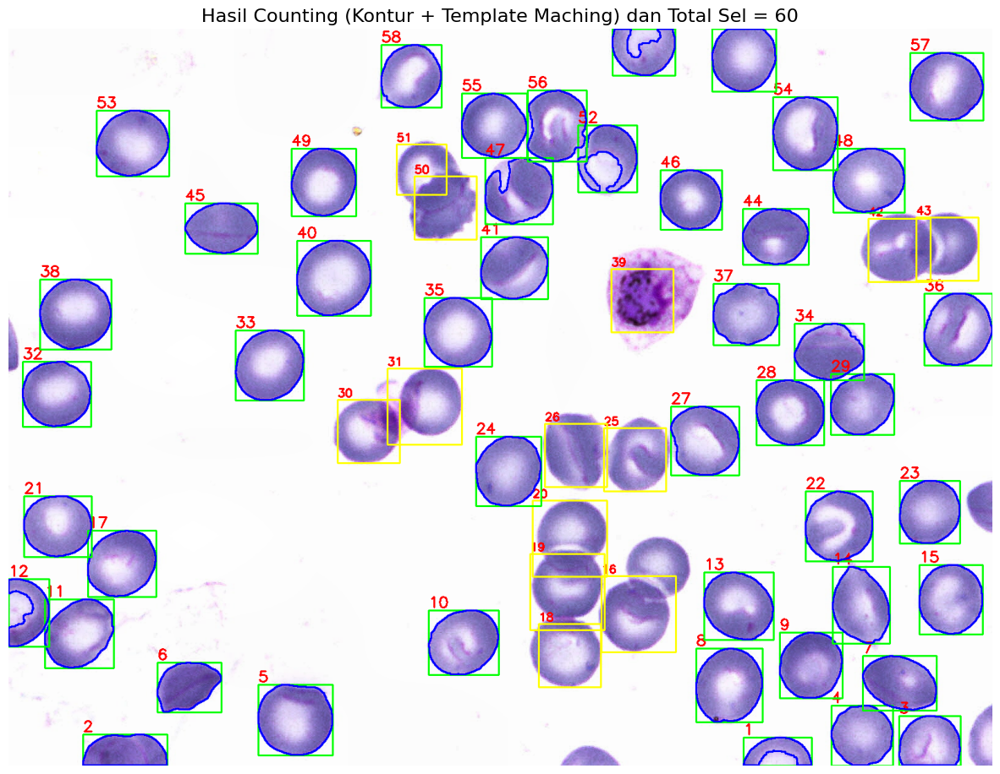

In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# load Template
sel_template = cv2.imread('template.png')
gray_template = cv2.cvtColor(sel_template, cv2.COLOR_BGR2GRAY)

# load image
image = cv2.imread("002f20ad-2ace-499c-9335-c9080bc3e6b5.png")
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (5, 5), 0)
_, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
kernel = np.ones((5, 5), np.uint8)
opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=1)

contours, _ = cv2.findContours(opening, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

output = image.copy()
font = cv2.FONT_HERSHEY_SIMPLEX

# Ambang area
min_area = 2500
area_split = 13000 #trial error

cell_id = 1
for cnt in contours:
    area = cv2.contourArea(cnt)
    if area > min_area:
        x, y, w, h = cv2.boundingRect(cnt)

        if area > area_split:
            roi = gray[y:y+h, x:x+w] #bounding rectangle, dari pojok kiri atas ditarik ke kanan dst #digunakan gray krn telah dilakukan opening di awal

            # --- Parameter multi-scale ---
            scales = np.linspace(0.4, 1.6, 10) #multi scale : supaya tidak hanya 1 size saja (selnya bisa besar bisa kecil)
            threshold = 0.42 #utk mengecek score dari template matching

            rects = []

            for scale in scales:
                tW = int(gray_template.shape[1] * scale)
                tH = int(gray_template.shape[0] * scale)
                if tW < 5 or tH < 5: #terlalu kecil diabaikan #roi/luas area/gambar referensinya harus lebih besar
                    continue

                if roi.shape[1] < tW or roi.shape[0] < tH:
                    continue

                resized_template = cv2.resize(gray_template, (tW, tH))
                result = cv2.matchTemplate(roi, resized_template, cv2.TM_CCOEFF_NORMED) #result disimpan dalam xy xy bukan xy wh

                loc = np.where(result >= threshold) #disimpan di loc

                for pt in zip(*loc[::-1]):
                    rects.append([pt[0], pt[1], pt[0] + tW, pt[1] + tH]) #kemudian di zip supaya jadi satu file

#bisajadi terdapat yg overlap

            # --- Non-Maximum Suppression --- # tujuannya utk memilih rectangle/result mana yg paling mendekati templatenya
            def nms(rects, overlapThresh=0.3):
                if len(rects) == 0:
                    return []
                rects = np.array(rects)
                x1, y1, x2, y2 = rects[:,0], rects[:,1], rects[:,2], rects[:,3]
                area = (x2 - x1 + 1) * (y2 - y1 + 1)
                idxs = np.argsort(y2)

                pick = []
                while len(idxs) > 0:
                    last = idxs[-1]
                    pick.append(last)

                    xx1 = np.maximum(x1[last], x1[idxs[:-1]])
                    yy1 = np.maximum(y1[last], y1[idxs[:-1]])
                    xx2 = np.minimum(x2[last], x2[idxs[:-1]])
                    yy2 = np.minimum(y2[last], y2[idxs[:-1]])

                    w = np.maximum(0, xx2 - xx1 + 1)
                    h = np.maximum(0, yy2 - yy1 + 1)

                    overlap = (w * h) / area[idxs[:-1]]

                    idxs = np.delete( #template yg kecil didelete
                        idxs,
                        np.concatenate(([len(idxs) - 1], np.where(overlap > overlapThresh)[0]))
                    )
                return rects[pick].astype("int")

            final_boxes = nms(rects)

            for (x1, y1, x2, y2) in final_boxes:
                cv2.rectangle(output, (x+x1, y+y1), (x+x2, y+y2), (0, 255, 255), 2)
                cv2.putText(output, str(cell_id), (x+x1, y+y1-5), font, 0.6, (0,0,255), 2)
                cell_id += 1
        else:
            (xb, yb, wb, hb) = cv2.boundingRect(cnt)
            cv2.rectangle(output, (xb, yb), (xb+wb, yb+hb), (0, 255, 0), 2)
            cv2.drawContours(output, [cnt], -1, (255,0,0), 2)
            cv2.putText(output, str(cell_id), (xb, yb-5), font, 0.8, (0,0,255), 2)
            cell_id += 1

cell_count = cell_id - 1
print("Jumlah sel darah yang terdeteksi:", cell_count)

plt.figure(figsize=(18,12))
plt.subplot(2,3,1); plt.title("Grayscale"); plt.imshow(gray, cmap="gray")
plt.subplot(2,3,2); plt.title("Gaussian Blur"); plt.imshow(blur, cmap="gray")
plt.subplot(2,3,3); plt.title("Threshold Otsu"); plt.imshow(thresh, cmap="gray")
plt.subplot(2,3,4); plt.title("Opening"); plt.imshow(opening, cmap="gray")
plt.tight_layout()
plt.show()

plt.figure(figsize=(15,15))
plt.title(f"Hasil Counting (Kontur + Template Maching) dan Total Sel = {cell_count}", fontsize=16)
plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

#Gambar 2

Program 1

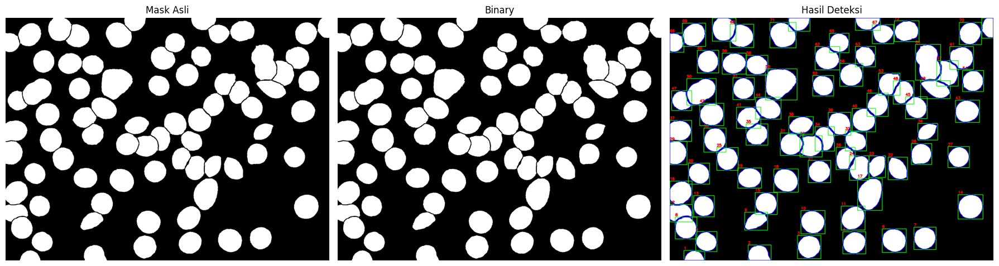

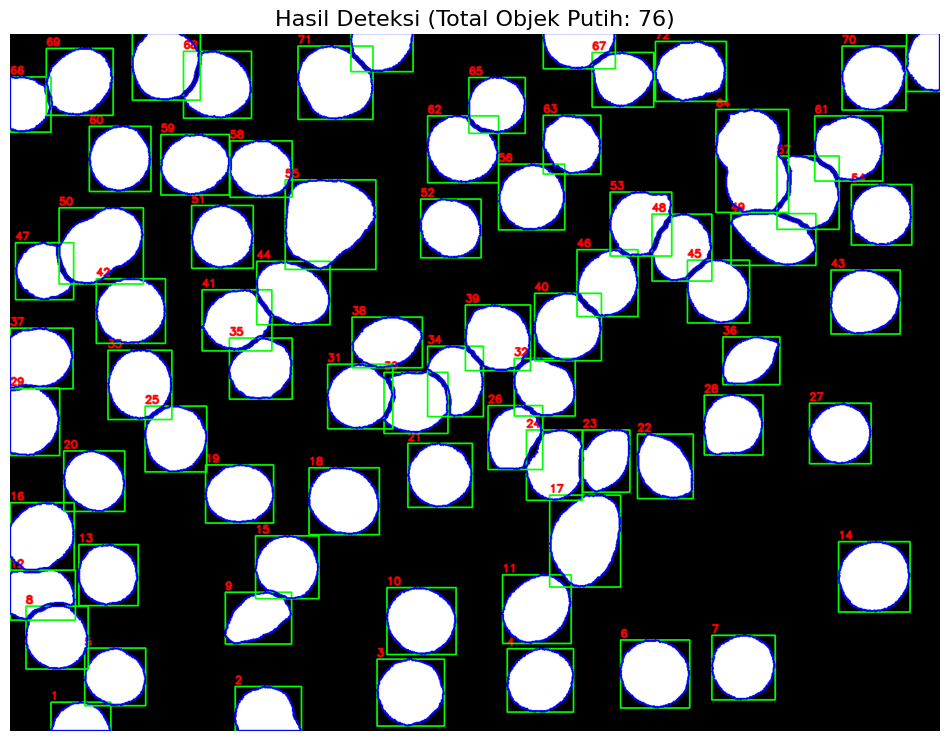

In [13]:
import cv2
import matplotlib.pyplot as plt

mask_path = "003a89b0-a095-417a-8dd6-f408339bbc68-mask.png"
mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

_, binary = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)

contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

output = cv2.imread(mask_path)
font = cv2.FONT_HERSHEY_SIMPLEX

for i, cnt in enumerate(contours, 1):
    x, y, w, h = cv2.boundingRect(cnt)
    cv2.rectangle(output, (x, y), (x+w, y+h), (0, 255, 0), 2)     # kotak hijau
    cv2.drawContours(output, [cnt], -1, (255, 0, 0), 2)           # kontur biru
    cv2.putText(output, str(i), (x, y-5), font, 0.6, (0,0,255), 2, cv2.LINE_AA)

plt.figure(figsize=(18,6))

plt.subplot(1,3,1); plt.title("Mask Asli"); plt.imshow(mask, cmap="gray"); plt.axis("off")
plt.subplot(1,3,2); plt.title("Binary"); plt.imshow(binary, cmap="gray"); plt.axis("off")
plt.subplot(1,3,3); plt.title("Hasil Deteksi"); plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB)); plt.axis("off")

plt.tight_layout()
plt.show()

plt.figure(figsize=(12,12))
plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
plt.title(f"Hasil Deteksi (Total Objek Putih: {len(contours)})", fontsize=16)
plt.axis("off")
plt.show()

Program 2

Jumlah sel terdeteksi (valid): 50


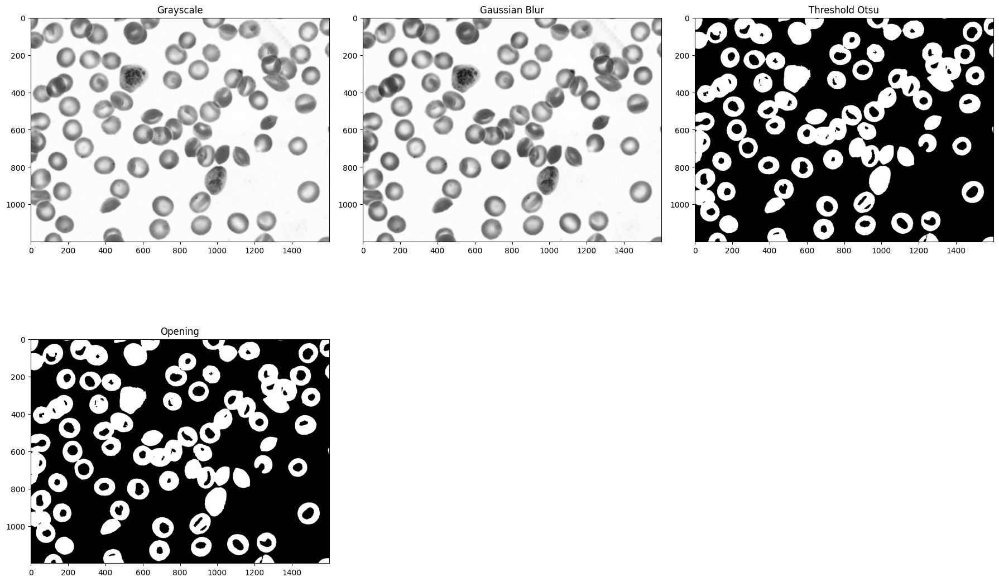

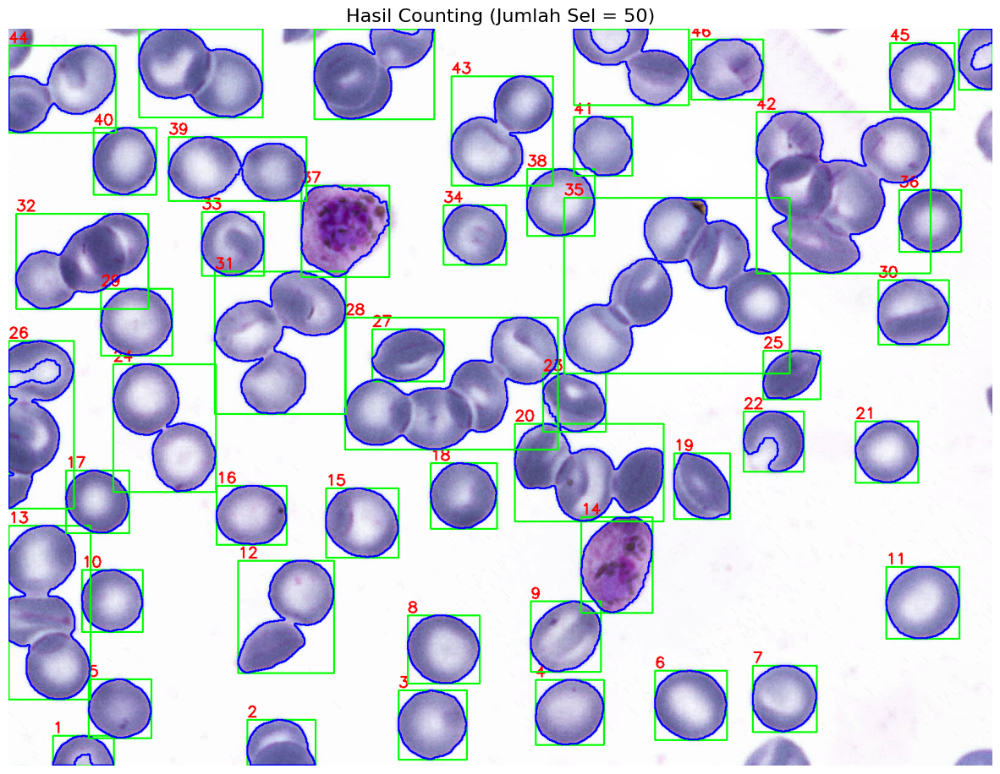

In [15]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img = cv2.imread("003a89b0-a095-417a-8dd6-f408339bbc68.png") #gambar original

#menghaluskan gambar sel dan menghilangkan noise
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) #convert ke gray
blur = cv2.GaussianBlur(gray, (5, 5), 0) #blurring gambar

#menggunakan thresholding otsu - mengubah ke black and whita supaya gambarnya menjadi 2 dimensi
_, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
kernel = np.ones((5, 5), np.uint8) #gambar yg overlapping
opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=1) #ukuran kernel kecil dan overlapping tipis (1/2 pixel) bisa digunakan morfologi

contours, _ = cv2.findContours(opening, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE) #mendapatkan kontur setelah terpisah utk dihitung selnya

output = img.copy()

min_area = 2500 #threshold static utk menghitung sel yg kecil dan terpotong di pinggir2
valid_count = 0
for i, cnt in enumerate(contours):
    area = cv2.contourArea(cnt)
    if area > min_area: #area : luas area dari sel yg akan dihitung #min area : menghitung data sel yg tidak perlu dihitung
        valid_count += 1
        (x, y, w, h) = cv2.boundingRect(cnt) #output xy (sumbu x dan y) wh (weight height)
        cv2.rectangle(output, (x, y), (x+w, y+h), (0, 255, 0), 2)
        cv2.drawContours(output, [cnt], -1, (255,0,0), 2)
        cv2.putText(output, str(valid_count), (x, y-5), cv2.FONT_HERSHEY_SIMPLEX,
                    0.8, (0, 0, 255), 2)

print("Jumlah sel terdeteksi (valid):", valid_count)

plt.figure(figsize=(18,12))

plt.subplot(2,3,1); plt.title("Grayscale"); plt.imshow(gray, cmap="gray")
plt.subplot(2,3,2); plt.title("Gaussian Blur"); plt.imshow(blur, cmap="gray")
plt.subplot(2,3,3); plt.title("Threshold Otsu"); plt.imshow(thresh, cmap="gray")
plt.subplot(2,3,4); plt.title("Opening"); plt.imshow(opening, cmap="gray")

plt.tight_layout()
plt.show()

plt.figure(figsize=(15,15))
plt.title(f"Hasil Counting (Jumlah Sel = {valid_count})", fontsize=16)
plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()


Program 3

Jumlah sel darah yang terdeteksi: 76


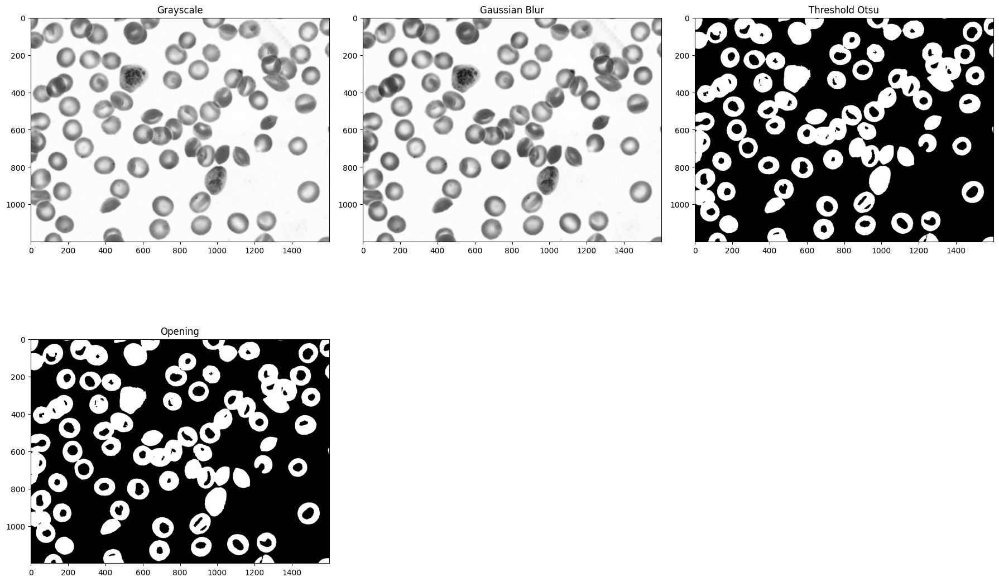

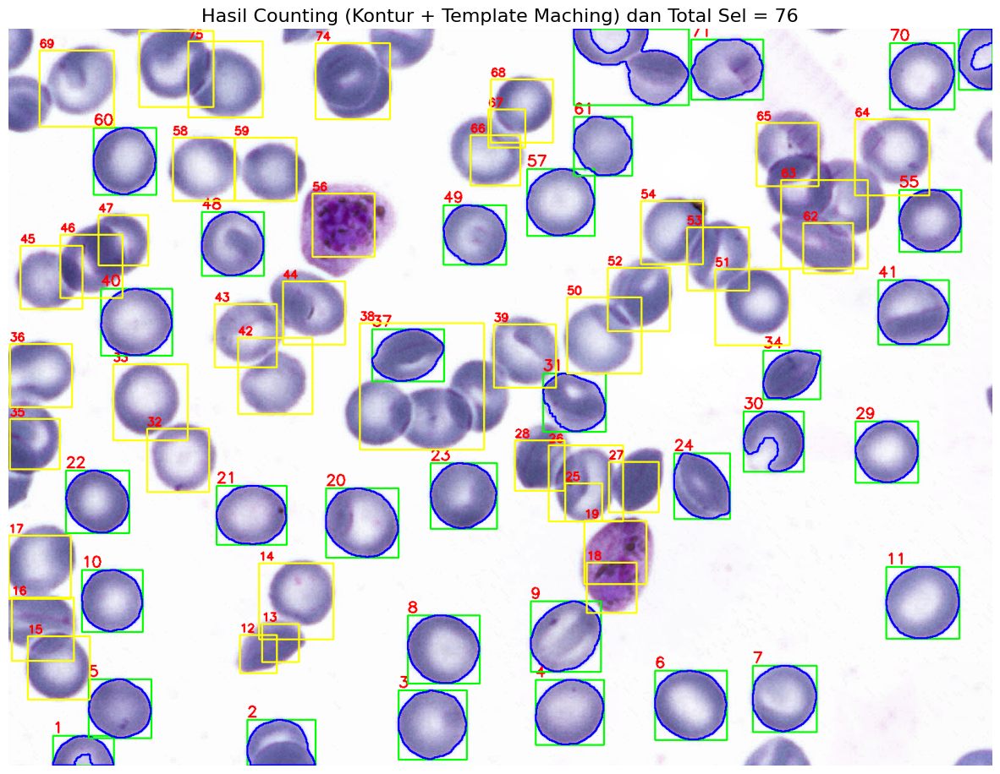

In [21]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# load Template
sel_template = cv2.imread('template.png')
gray_template = cv2.cvtColor(sel_template, cv2.COLOR_BGR2GRAY)

# load image
image = cv2.imread("003a89b0-a095-417a-8dd6-f408339bbc68.png")
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (5, 5), 0)
_, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
kernel = np.ones((5, 5), np.uint8)
opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=1)

contours, _ = cv2.findContours(opening, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

output = image.copy()
font = cv2.FONT_HERSHEY_SIMPLEX

# Ambang area
min_area = 2500
area_split = 13000 #trial error

cell_id = 1
for cnt in contours:
    area = cv2.contourArea(cnt)
    if area > min_area:
        x, y, w, h = cv2.boundingRect(cnt)

        if area > area_split:
            roi = gray[y:y+h, x:x+w] #bounding rectangle, dari pojok kiri atas ditarik ke kanan dst #digunakan gray krn telah dilakukan opening di awal

            # --- Parameter multi-scale ---
            scales = np.linspace(0.4, 1.6, 10) #multi scale : supaya tidak hanya 1 size saja (selnya bisa besar bisa kecil)
            threshold = 0.35 #utk mengecek score dari template matching

            rects = []

            for scale in scales:
                tW = int(gray_template.shape[1] * scale)
                tH = int(gray_template.shape[0] * scale)
                if tW < 5 or tH < 5: #terlalu kecil diabaikan #roi/luas area/gambar referensinya harus lebih besar
                    continue

                if roi.shape[1] < tW or roi.shape[0] < tH:
                    continue

                resized_template = cv2.resize(gray_template, (tW, tH))
                result = cv2.matchTemplate(roi, resized_template, cv2.TM_CCOEFF_NORMED) #result disimpan dalam xy xy bukan xy wh

                loc = np.where(result >= threshold) #disimpan di loc

                for pt in zip(*loc[::-1]):
                    rects.append([pt[0], pt[1], pt[0] + tW, pt[1] + tH]) #kemudian di zip supaya jadi satu file

#bisajadi terdapat yg overlap

            # --- Non-Maximum Suppression --- # tujuannya utk memilih rectangle/result mana yg paling mendekati templatenya
            def nms(rects, overlapThresh=0.3):
                if len(rects) == 0:
                    return []
                rects = np.array(rects)
                x1, y1, x2, y2 = rects[:,0], rects[:,1], rects[:,2], rects[:,3]
                area = (x2 - x1 + 1) * (y2 - y1 + 1)
                idxs = np.argsort(y2)

                pick = []
                while len(idxs) > 0:
                    last = idxs[-1]
                    pick.append(last)

                    xx1 = np.maximum(x1[last], x1[idxs[:-1]])
                    yy1 = np.maximum(y1[last], y1[idxs[:-1]])
                    xx2 = np.minimum(x2[last], x2[idxs[:-1]])
                    yy2 = np.minimum(y2[last], y2[idxs[:-1]])

                    w = np.maximum(0, xx2 - xx1 + 1)
                    h = np.maximum(0, yy2 - yy1 + 1)

                    overlap = (w * h) / area[idxs[:-1]]

                    idxs = np.delete( #template yg kecil didelete
                        idxs,
                        np.concatenate(([len(idxs) - 1], np.where(overlap > overlapThresh)[0]))
                    )
                return rects[pick].astype("int")

            final_boxes = nms(rects)

            for (x1, y1, x2, y2) in final_boxes:
                cv2.rectangle(output, (x+x1, y+y1), (x+x2, y+y2), (0, 255, 255), 2)
                cv2.putText(output, str(cell_id), (x+x1, y+y1-5), font, 0.6, (0,0,255), 2)
                cell_id += 1
        else:
            (xb, yb, wb, hb) = cv2.boundingRect(cnt)
            cv2.rectangle(output, (xb, yb), (xb+wb, yb+hb), (0, 255, 0), 2)
            cv2.drawContours(output, [cnt], -1, (255,0,0), 2)
            cv2.putText(output, str(cell_id), (xb, yb-5), font, 0.8, (0,0,255), 2)
            cell_id += 1

cell_count = cell_id - 1
print("Jumlah sel darah yang terdeteksi:", cell_count)

plt.figure(figsize=(18,12))
plt.subplot(2,3,1); plt.title("Grayscale"); plt.imshow(gray, cmap="gray")
plt.subplot(2,3,2); plt.title("Gaussian Blur"); plt.imshow(blur, cmap="gray")
plt.subplot(2,3,3); plt.title("Threshold Otsu"); plt.imshow(thresh, cmap="gray")
plt.subplot(2,3,4); plt.title("Opening"); plt.imshow(opening, cmap="gray")
plt.tight_layout()
plt.show()

plt.figure(figsize=(15,15))
plt.title(f"Hasil Counting (Kontur + Template Maching) dan Total Sel = {cell_count}", fontsize=16)
plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

#Gambar 3

Program 1

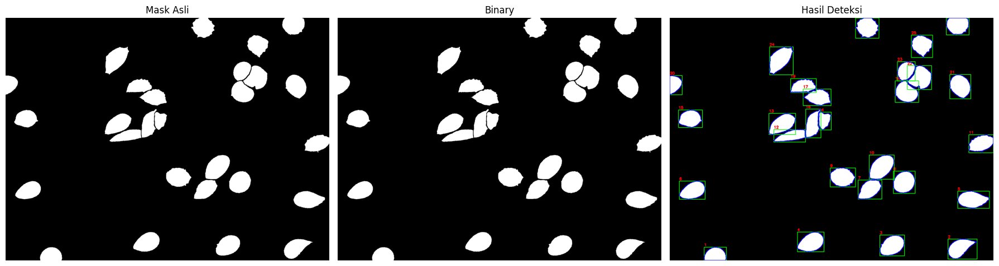

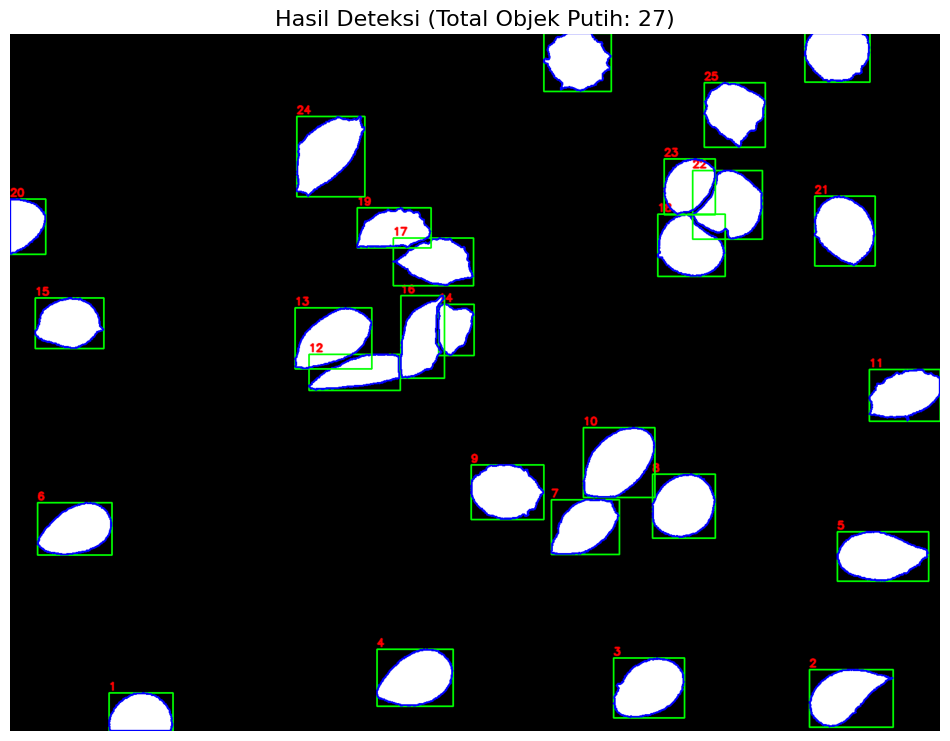

In [14]:
import cv2
import matplotlib.pyplot as plt

mask_path = "003d1cdc-0aec-430b-90e0-f4d82135b1ac-mask.png"
mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

_, binary = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)

contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

output = cv2.imread(mask_path)
font = cv2.FONT_HERSHEY_SIMPLEX

for i, cnt in enumerate(contours, 1):
    x, y, w, h = cv2.boundingRect(cnt)
    cv2.rectangle(output, (x, y), (x+w, y+h), (0, 255, 0), 2)     # kotak hijau
    cv2.drawContours(output, [cnt], -1, (255, 0, 0), 2)           # kontur biru
    cv2.putText(output, str(i), (x, y-5), font, 0.6, (0,0,255), 2, cv2.LINE_AA)

plt.figure(figsize=(18,6))

plt.subplot(1,3,1); plt.title("Mask Asli"); plt.imshow(mask, cmap="gray"); plt.axis("off")
plt.subplot(1,3,2); plt.title("Binary"); plt.imshow(binary, cmap="gray"); plt.axis("off")
plt.subplot(1,3,3); plt.title("Hasil Deteksi"); plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB)); plt.axis("off")

plt.tight_layout()
plt.show()

plt.figure(figsize=(12,12))
plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
plt.title(f"Hasil Deteksi (Total Objek Putih: {len(contours)})", fontsize=16)
plt.axis("off")
plt.show()

Program 2

Jumlah sel terdeteksi (valid): 23


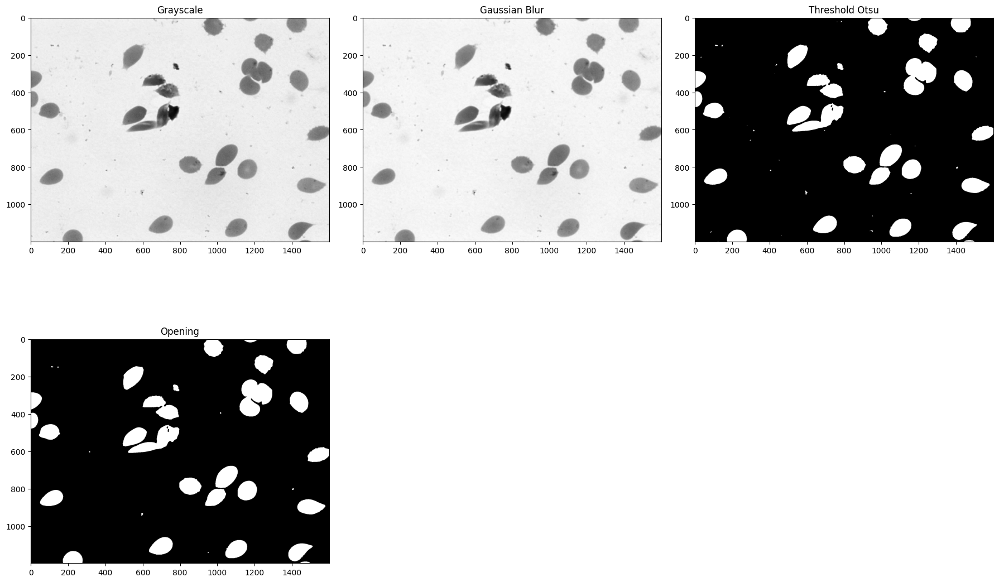

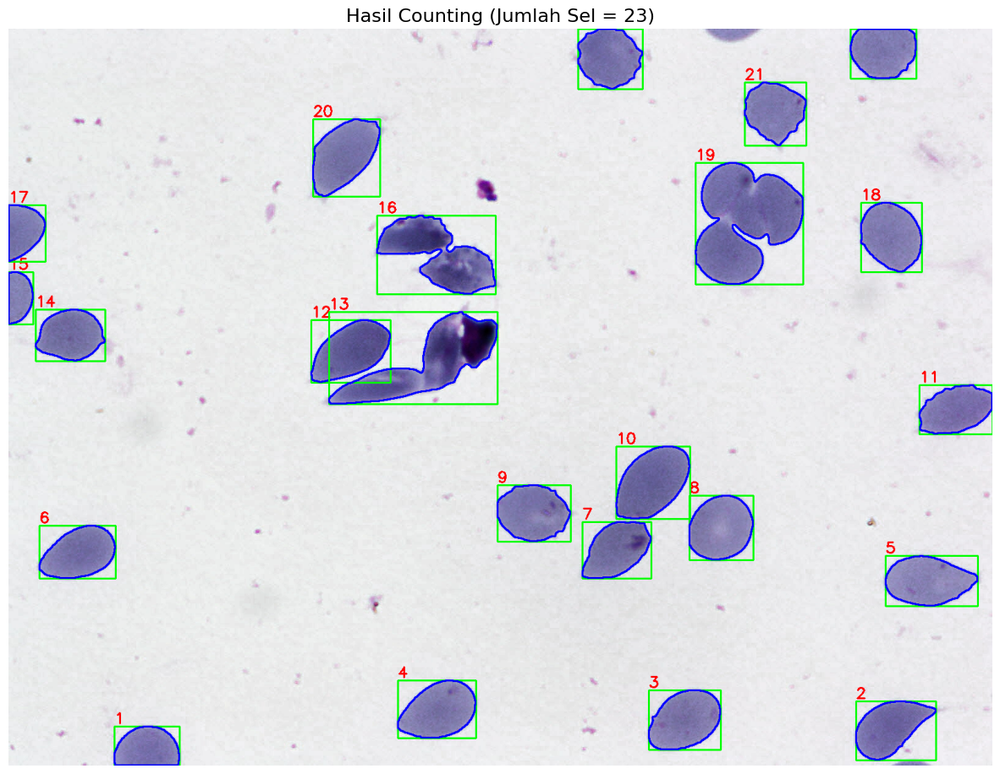

In [16]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img = cv2.imread("003d1cdc-0aec-430b-90e0-f4d82135b1ac.png") #gambar original

#menghaluskan gambar sel dan menghilangkan noise
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) #convert ke gray
blur = cv2.GaussianBlur(gray, (5, 5), 0) #blurring gambar

#menggunakan thresholding otsu - mengubah ke black and whita supaya gambarnya menjadi 2 dimensi
_, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
kernel = np.ones((5, 5), np.uint8) #gambar yg overlapping
opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=1) #ukuran kernel kecil dan overlapping tipis (1/2 pixel) bisa digunakan morfologi

contours, _ = cv2.findContours(opening, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE) #mendapatkan kontur setelah terpisah utk dihitung selnya

output = img.copy()

min_area = 2500 #threshold static utk menghitung sel yg kecil dan terpotong di pinggir2
valid_count = 0
for i, cnt in enumerate(contours):
    area = cv2.contourArea(cnt)
    if area > min_area: #area : luas area dari sel yg akan dihitung #min area : menghitung data sel yg tidak perlu dihitung
        valid_count += 1
        (x, y, w, h) = cv2.boundingRect(cnt) #output xy (sumbu x dan y) wh (weight height)
        cv2.rectangle(output, (x, y), (x+w, y+h), (0, 255, 0), 2)
        cv2.drawContours(output, [cnt], -1, (255,0,0), 2)
        cv2.putText(output, str(valid_count), (x, y-5), cv2.FONT_HERSHEY_SIMPLEX,
                    0.8, (0, 0, 255), 2)

print("Jumlah sel terdeteksi (valid):", valid_count)

plt.figure(figsize=(18,12))

plt.subplot(2,3,1); plt.title("Grayscale"); plt.imshow(gray, cmap="gray")
plt.subplot(2,3,2); plt.title("Gaussian Blur"); plt.imshow(blur, cmap="gray")
plt.subplot(2,3,3); plt.title("Threshold Otsu"); plt.imshow(thresh, cmap="gray")
plt.subplot(2,3,4); plt.title("Opening"); plt.imshow(opening, cmap="gray")

plt.tight_layout()
plt.show()

plt.figure(figsize=(15,15))
plt.title(f"Hasil Counting (Jumlah Sel = {valid_count})", fontsize=16)
plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()


Program 3

Jumlah sel darah yang terdeteksi: 27


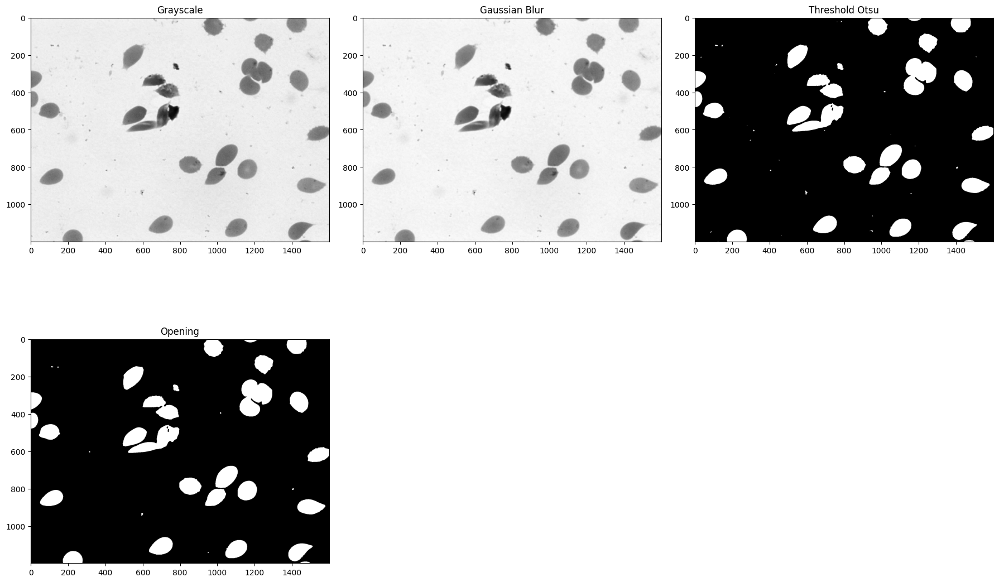

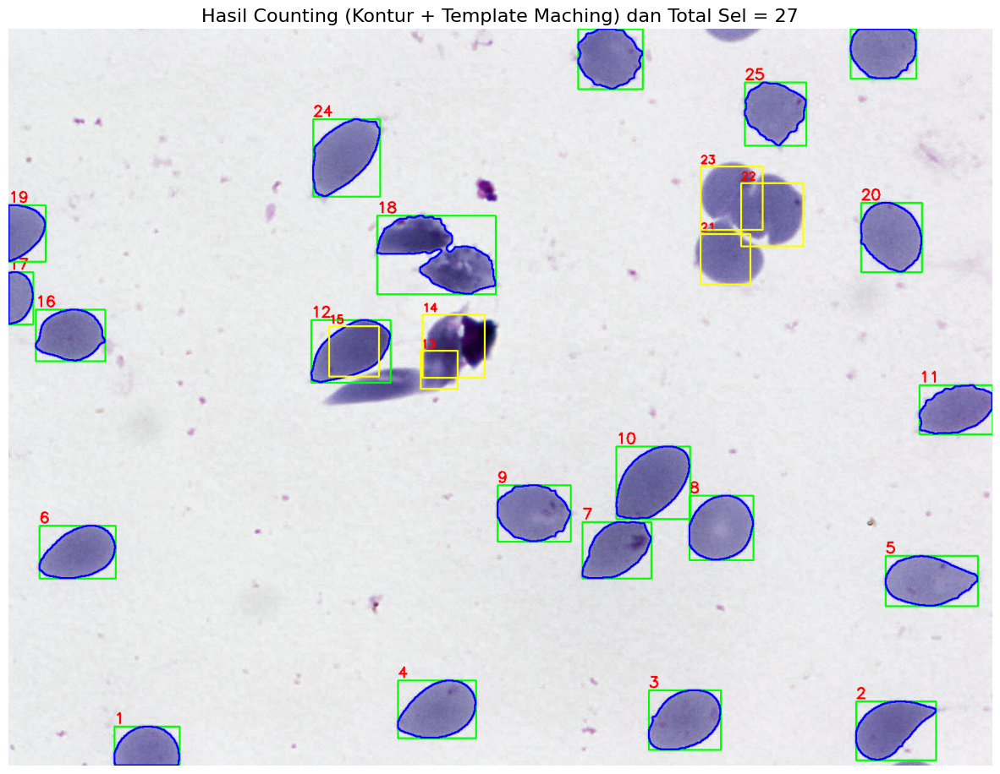

In [20]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# load Template
sel_template = cv2.imread('template.png')
gray_template = cv2.cvtColor(sel_template, cv2.COLOR_BGR2GRAY)

# load image
image = cv2.imread("003d1cdc-0aec-430b-90e0-f4d82135b1ac.png")
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (5, 5), 0)
_, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
kernel = np.ones((5, 5), np.uint8)
opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=1)

contours, _ = cv2.findContours(opening, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

output = image.copy()
font = cv2.FONT_HERSHEY_SIMPLEX

# Ambang area
min_area = 2500
area_split = 13000 #trial error

cell_id = 1
for cnt in contours:
    area = cv2.contourArea(cnt)
    if area > min_area:
        x, y, w, h = cv2.boundingRect(cnt)

        if area > area_split:
            roi = gray[y:y+h, x:x+w] #bounding rectangle, dari pojok kiri atas ditarik ke kanan dst #digunakan gray krn telah dilakukan opening di awal

            # --- Parameter multi-scale ---
            scales = np.linspace(0.4, 1.6, 10) #multi scale : supaya tidak hanya 1 size saja (selnya bisa besar bisa kecil)
            threshold = 0.35 #utk mengecek score dari template matching

            rects = []

            for scale in scales:
                tW = int(gray_template.shape[1] * scale)
                tH = int(gray_template.shape[0] * scale)
                if tW < 5 or tH < 5: #terlalu kecil diabaikan #roi/luas area/gambar referensinya harus lebih besar
                    continue

                if roi.shape[1] < tW or roi.shape[0] < tH:
                    continue

                resized_template = cv2.resize(gray_template, (tW, tH))
                result = cv2.matchTemplate(roi, resized_template, cv2.TM_CCOEFF_NORMED) #result disimpan dalam xy xy bukan xy wh

                loc = np.where(result >= threshold) #disimpan di loc

                for pt in zip(*loc[::-1]):
                    rects.append([pt[0], pt[1], pt[0] + tW, pt[1] + tH]) #kemudian di zip supaya jadi satu file

#bisajadi terdapat yg overlap

            # --- Non-Maximum Suppression --- # tujuannya utk memilih rectangle/result mana yg paling mendekati templatenya
            def nms(rects, overlapThresh=0.3):
                if len(rects) == 0:
                    return []
                rects = np.array(rects)
                x1, y1, x2, y2 = rects[:,0], rects[:,1], rects[:,2], rects[:,3]
                area = (x2 - x1 + 1) * (y2 - y1 + 1)
                idxs = np.argsort(y2)

                pick = []
                while len(idxs) > 0:
                    last = idxs[-1]
                    pick.append(last)

                    xx1 = np.maximum(x1[last], x1[idxs[:-1]])
                    yy1 = np.maximum(y1[last], y1[idxs[:-1]])
                    xx2 = np.minimum(x2[last], x2[idxs[:-1]])
                    yy2 = np.minimum(y2[last], y2[idxs[:-1]])

                    w = np.maximum(0, xx2 - xx1 + 1)
                    h = np.maximum(0, yy2 - yy1 + 1)

                    overlap = (w * h) / area[idxs[:-1]]

                    idxs = np.delete( #template yg kecil didelete
                        idxs,
                        np.concatenate(([len(idxs) - 1], np.where(overlap > overlapThresh)[0]))
                    )
                return rects[pick].astype("int")

            final_boxes = nms(rects)

            for (x1, y1, x2, y2) in final_boxes:
                cv2.rectangle(output, (x+x1, y+y1), (x+x2, y+y2), (0, 255, 255), 2)
                cv2.putText(output, str(cell_id), (x+x1, y+y1-5), font, 0.6, (0,0,255), 2)
                cell_id += 1
        else:
            (xb, yb, wb, hb) = cv2.boundingRect(cnt)
            cv2.rectangle(output, (xb, yb), (xb+wb, yb+hb), (0, 255, 0), 2)
            cv2.drawContours(output, [cnt], -1, (255,0,0), 2)
            cv2.putText(output, str(cell_id), (xb, yb-5), font, 0.8, (0,0,255), 2)
            cell_id += 1

cell_count = cell_id - 1
print("Jumlah sel darah yang terdeteksi:", cell_count)

plt.figure(figsize=(18,12))
plt.subplot(2,3,1); plt.title("Grayscale"); plt.imshow(gray, cmap="gray")
plt.subplot(2,3,2); plt.title("Gaussian Blur"); plt.imshow(blur, cmap="gray")
plt.subplot(2,3,3); plt.title("Threshold Otsu"); plt.imshow(thresh, cmap="gray")
plt.subplot(2,3,4); plt.title("Opening"); plt.imshow(opening, cmap="gray")
plt.tight_layout()
plt.show()

plt.figure(figsize=(15,15))
plt.title(f"Hasil Counting (Kontur + Template Maching) dan Total Sel = {cell_count}", fontsize=16)
plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

#Hasil analisa

1. Bagaimana hasil dari program counting data pada data mask ?
2. Bagaimana hasil dari program counting data sederhana ?
3. Bagaimana hasil dari program counting dengan handling pada data yang overlap ?

Berikut hasil percobaan handling overlap data dari ketiga data yang tersedia.
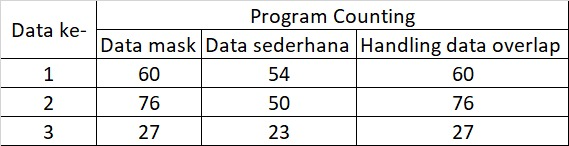

Pada data pertama, dilakukan penggantian thresholding menjadi 0.42 sehingga diperoleh hasil yang sama dengan data mask yaitu 60 sel

Pada data kedua, dilakukan penggantian thresholding menjadi 0.35 sehingga diperoleh hasil yang sama dengan data mask yaitu 76 sel

Pada data ketiga, dilakukan penggantian thresholding menjadi 0.35 sehingga diperoleh hasil yang sama dengan data mask yaitu 27 sel

###Kesimpulan
Berdasarkan hasil yang diperoleh, dapat saya simpulkan bahwa program counting dengan handling pada data yang overlap dapat berjalan dengan optimal dengan melakukan beberapa percobaan penggantian threshold.